In [72]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

In [73]:
data = pd.read_csv('SDSS-Gaia_5950stars.csv')


#remove first column
data = data.iloc[:, 1:]

#data = data[
    #(data["Energy"] <= 100000) &
    #(data["Lz"] <= 50000)
#]
data.info()
data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5950 entries, 0 to 5949
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   J       5950 non-null   float64
 1   H       5950 non-null   float64
 2   K       5950 non-null   float64
 3   C_FE    5950 non-null   float64
 4   N_FE    5950 non-null   float64
 5   O_FE    5950 non-null   float64
 6   NA_FE   5950 non-null   float64
 7   MG_FE   5950 non-null   float64
 8   AL_FE   5950 non-null   float64
 9   SI_FE   5950 non-null   float64
 10  CA_FE   5950 non-null   float64
 11  S_FE    5950 non-null   float64
 12  V_FE    5950 non-null   float64
 13  CR_FE   5950 non-null   float64
 14  FE_H    5950 non-null   float64
 15  CO_FE   5950 non-null   float64
 16  NI_FE   5950 non-null   float64
 17  E       5950 non-null   float64
 18  Energy  5950 non-null   float64
 19  Lz      5950 non-null   float64
dtypes: float64(20)
memory usage: 929.8 KB


,J,H,K,C_FE,N_FE,O_FE,NA_FE,MG_FE,AL_FE,SI_FE,CA_FE,S_FE,V_FE,CR_FE,FE_H,CO_FE,NI_FE,E,Energy,Lz
0,13.761,12.882,12.733,-0.55730,0.121530,-0.058410,-0.656198,-0.098967,-0.762219,-0.087906,0.031485,0.542042,-0.649838,-0.531586,-1.14850,-0.14573,-0.195007,0.306008,22115.660768,1012.248998
1,14.134,13.344,13.250,-0.55490,0.216510,0.120292,-0.077998,-0.030772,-0.465619,0.118681,0.102875,0.176822,-0.500538,-0.282986,-1.05660,-0.22613,-0.071108,0.391866,41705.742939,3540.648917
2,14.646,14.024,13.744,-0.57650,0.440610,0.059940,0.247772,-0.013754,-0.213769,-0.042152,0.036315,0.579082,0.339922,0.516684,-0.98495,0.02452,-0.057557,0.629223,-10492.912912,-835.158712
3,14.208,13.426,13.346,-0.57267,-0.054657,-0.001759,0.133502,-0.194887,-0.626319,0.057021,-0.084456,0.142352,0.231272,-1.088186,-1.16200,-0.36663,-0.151808,0.333420,9371.299309,35.651705
4,13.819,13.031,12.882,-0.59562,0.120780,0.045731,-0.006498,-0.078007,-0.570919,0.035366,0.191595,0.678072,-0.971138,-0.010586,-1.33410,-0.17063,-0.064307,0.347582,12680.876488,-297.262299
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5945,14.037,13.258,13.065,-0.67951,0.174650,0.078442,0.030302,0.051686,-0.616319,0.050282,0.063495,0.746292,-0.984538,-0.971486,-1.40980,-0.21573,-0.023307,0.295198,19744.412089,-57.382071
5946,13.772,13.016,12.868,-0.66522,0.132760,-0.017158,-0.066698,-0.096447,-0.649019,-0.059972,0.014995,0.714822,-0.192938,-1.090386,-1.20110,-0.40203,-0.144607,0.286301,20157.189062,252.301750
5947,12.678,11.839,11.628,-0.40795,-0.070210,-0.057623,-0.740508,-0.144017,-0.718029,-0.089411,-0.035848,0.554992,-0.310698,-0.029596,-0.61699,-0.11610,-0.176568,0.556469,26286.205329,1826.314315
5948,11.897,11.167,11.035,-0.35260,0.011449,0.178443,-0.630108,0.129937,-0.280829,0.122801,0.149805,0.265742,-0.203448,-0.137696,-0.87069,-0.19624,-0.044348,0.925971,-15099.456283,485.813047


In [74]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import TSNE

import umap

X = data.select_dtypes(include=[np.number]).dropna()


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

kpca = KernelPCA(n_components=2, kernel='rbf', gamma=0.1)
X_kpca = kpca.fit_transform(X_scaled)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

umap_model = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)

/home/jona/micromamba/envs/appmlenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


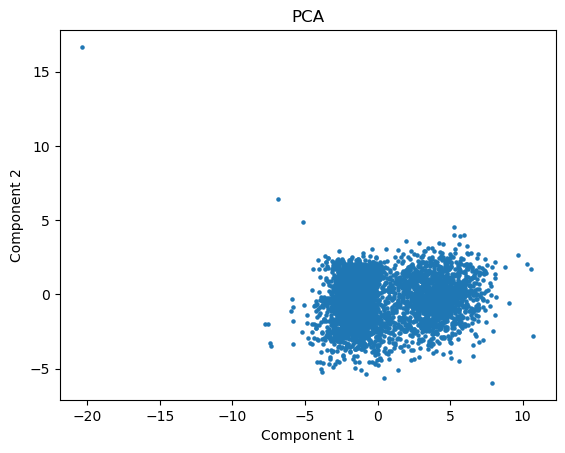

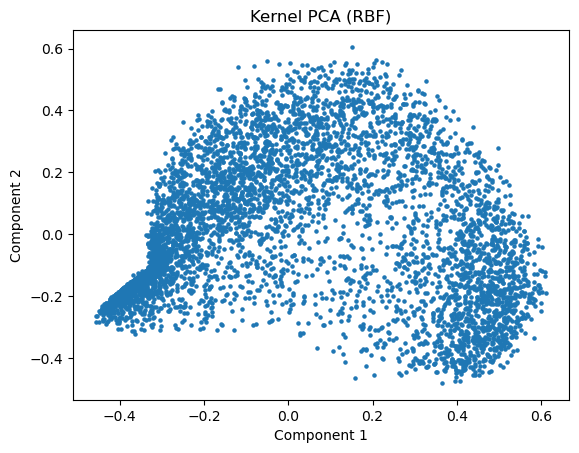

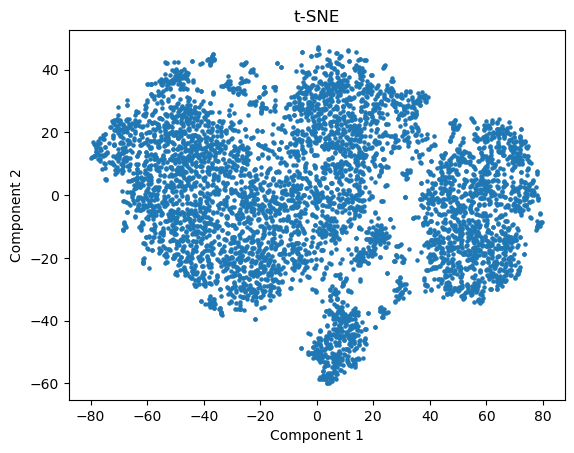

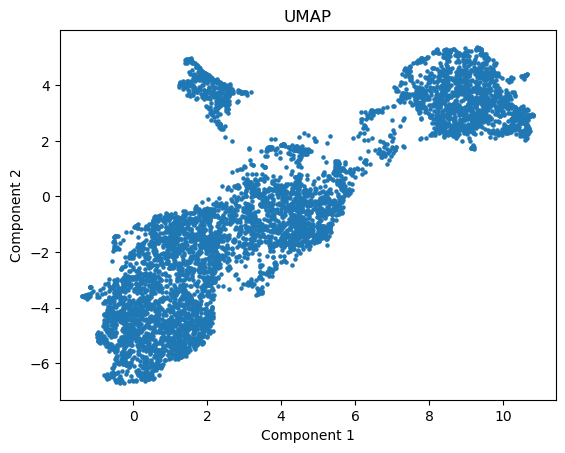

In [75]:
def plot_embedding(X_embedded, title):
    plt.figure()
    plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s = 5)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.show()

plot_embedding(X_pca, "PCA")
plot_embedding(X_kpca, "Kernel PCA (RBF)")
plot_embedding(X_tsne, "t-SNE")
plot_embedding(X_umap, "UMAP")

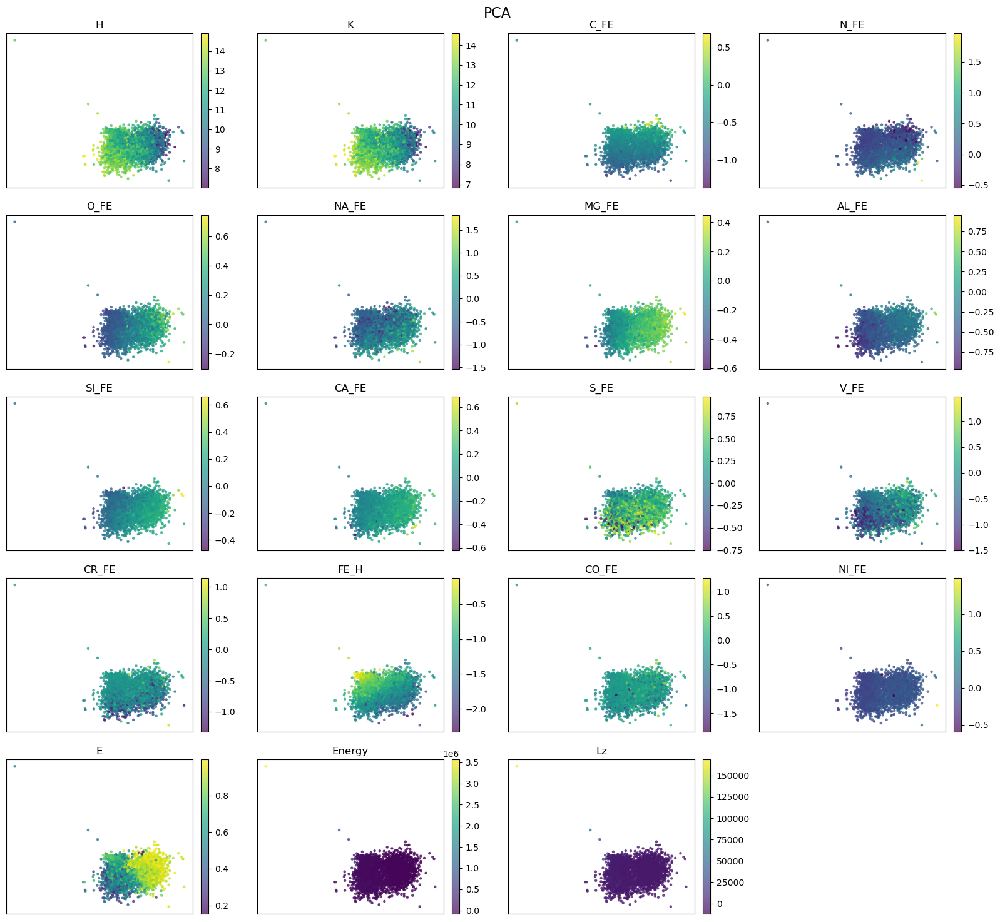

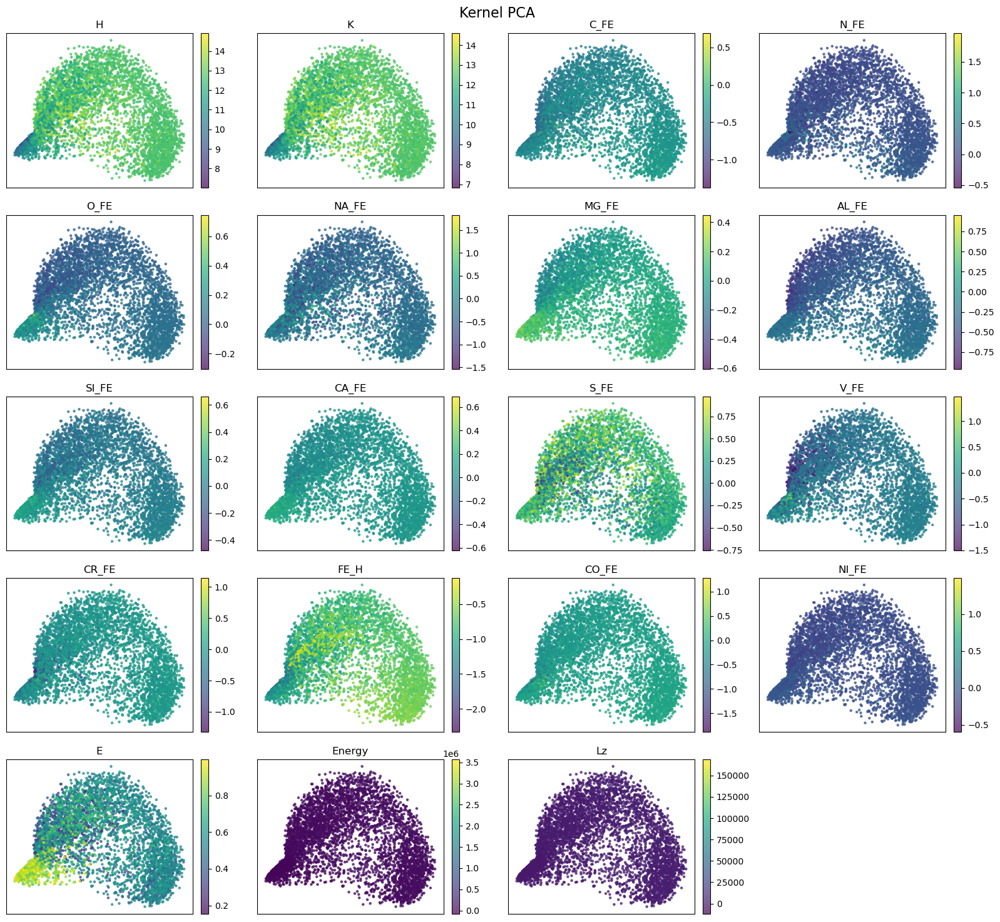

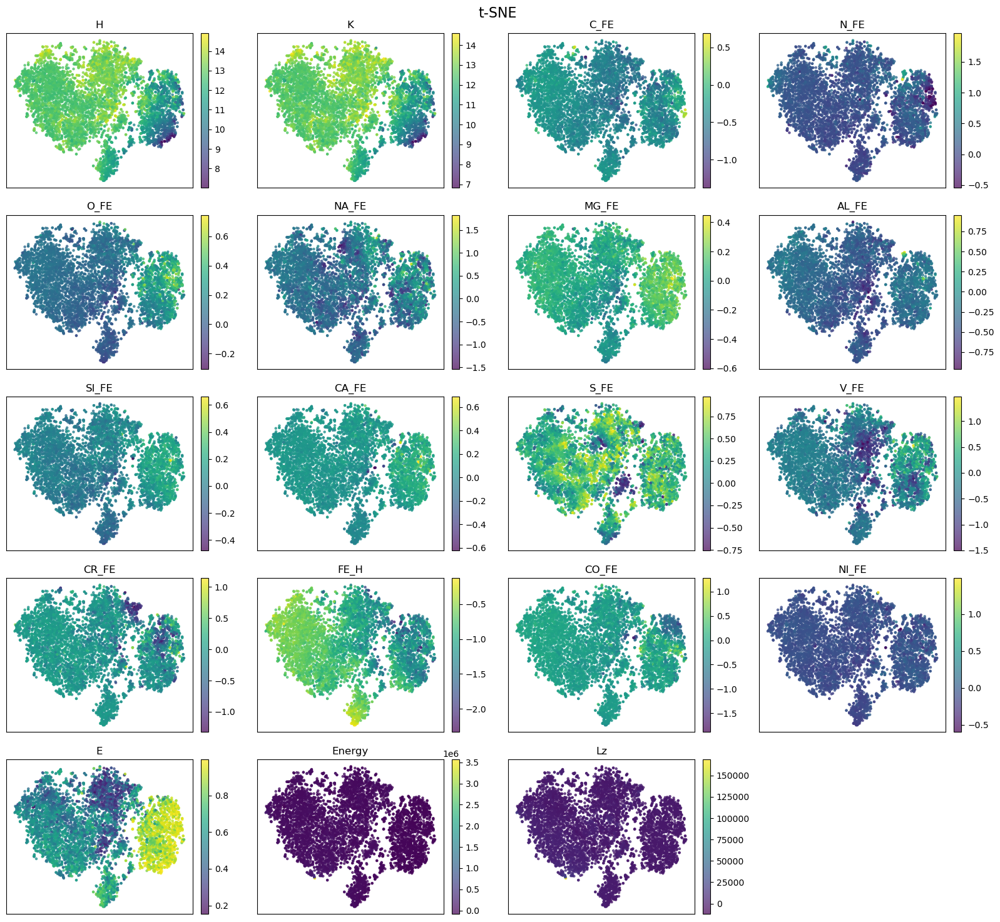

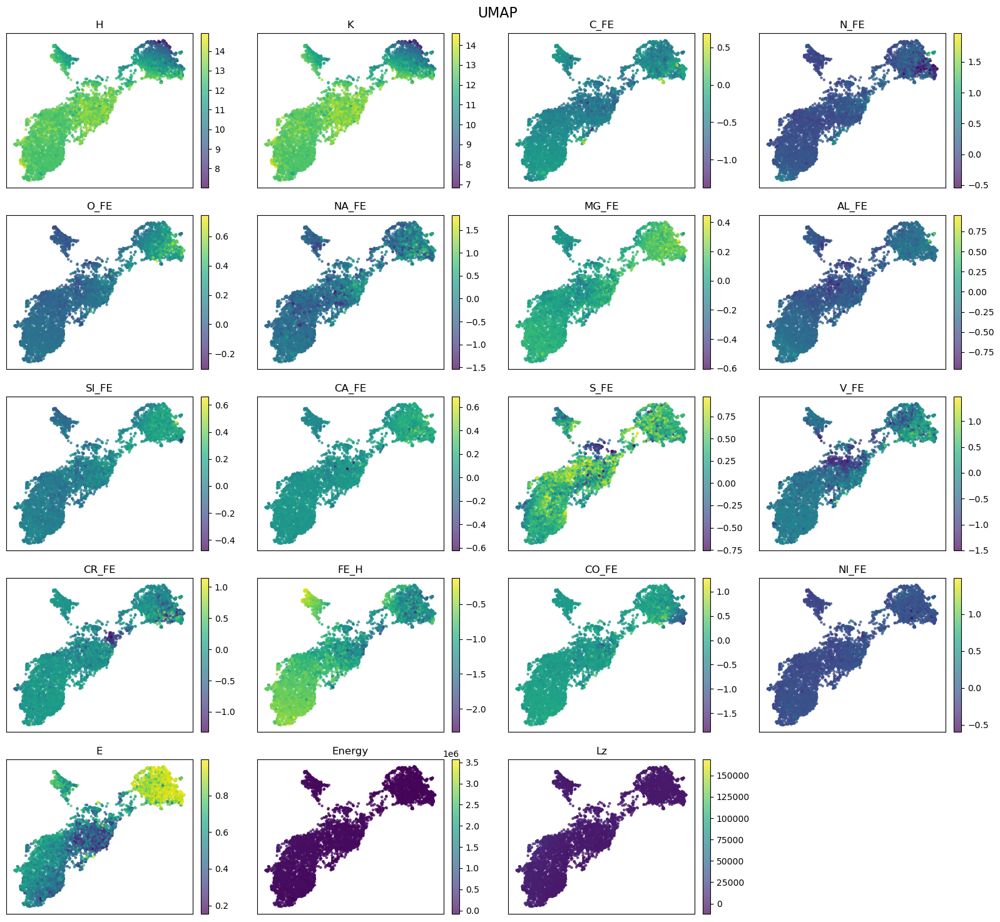

In [76]:
import math
import matplotlib.pyplot as plt

def plot_all_features(X_embedded, title, df_features):
    n = len(df_features)
    ncols = 4  # adjust layout
    nrows = math.ceil(n / ncols)

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
    axes = axes.flatten()

    for i, feature in enumerate(df_features):
        ax = axes[i]

        sc = ax.scatter(
            X_embedded[:, 0],
            X_embedded[:, 1],
            c=X[feature],
            cmap='viridis',
            s=5,
            alpha=0.7
        )

        ax.set_title(feature)
        ax.set_xticks([])
        ax.set_yticks([])

        # optional: small colorbar per subplot (can be heavy if many features)
        fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    # remove empty subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


# ---- Run for each method ----
plot_all_features(X_pca, "PCA", features)
plot_all_features(X_kpca, "Kernel PCA", features)
plot_all_features(X_tsne, "t-SNE", features)
plot_all_features(X_umap, "UMAP", features)

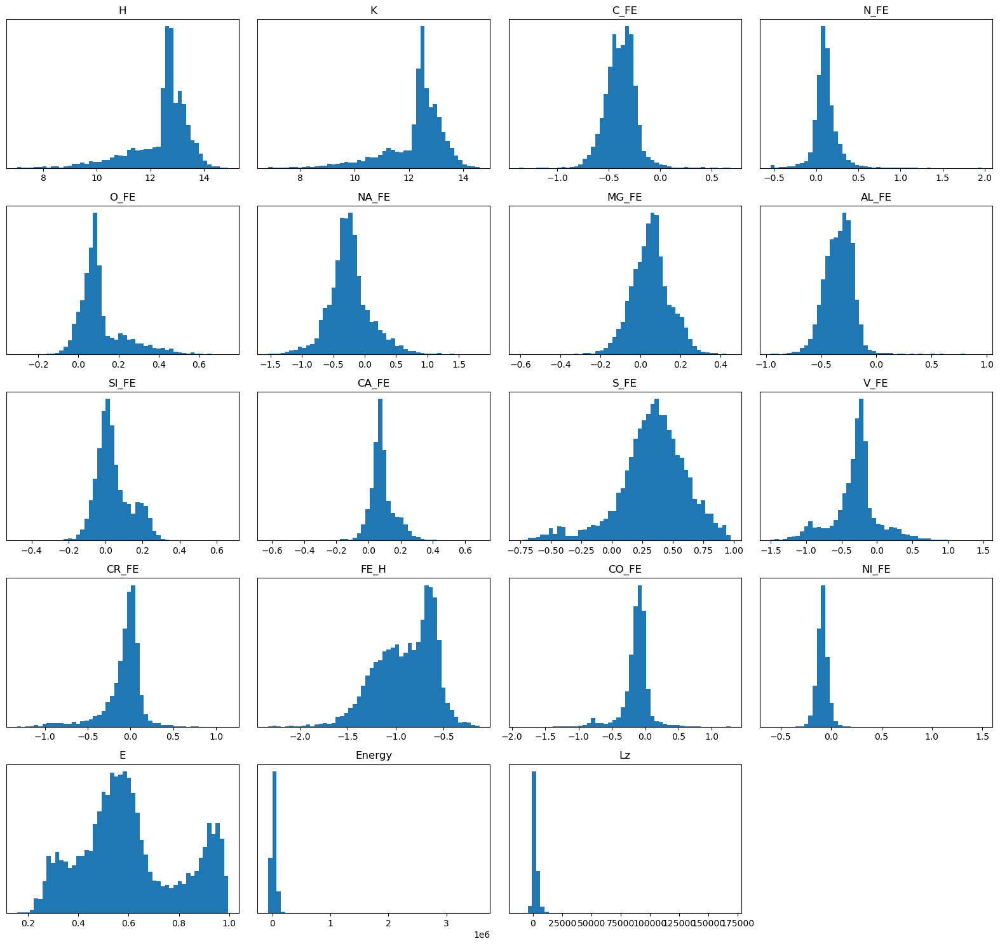

In [77]:
# skip first column again
features = data.columns.tolist()[1:]

def plot_histograms(df, features, bins=50):
    n = len(features)
    ncols = 4
    nrows = math.ceil(n / ncols)

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
    axes = axes.flatten()

    for i, feature in enumerate(features):
        ax = axes[i]
        values = df[feature].dropna()

        ax.hist(values, bins=bins)
        ax.set_title(feature)
        ax.set_yticks([])

    # remove empty plots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

plot_histograms(X, features)

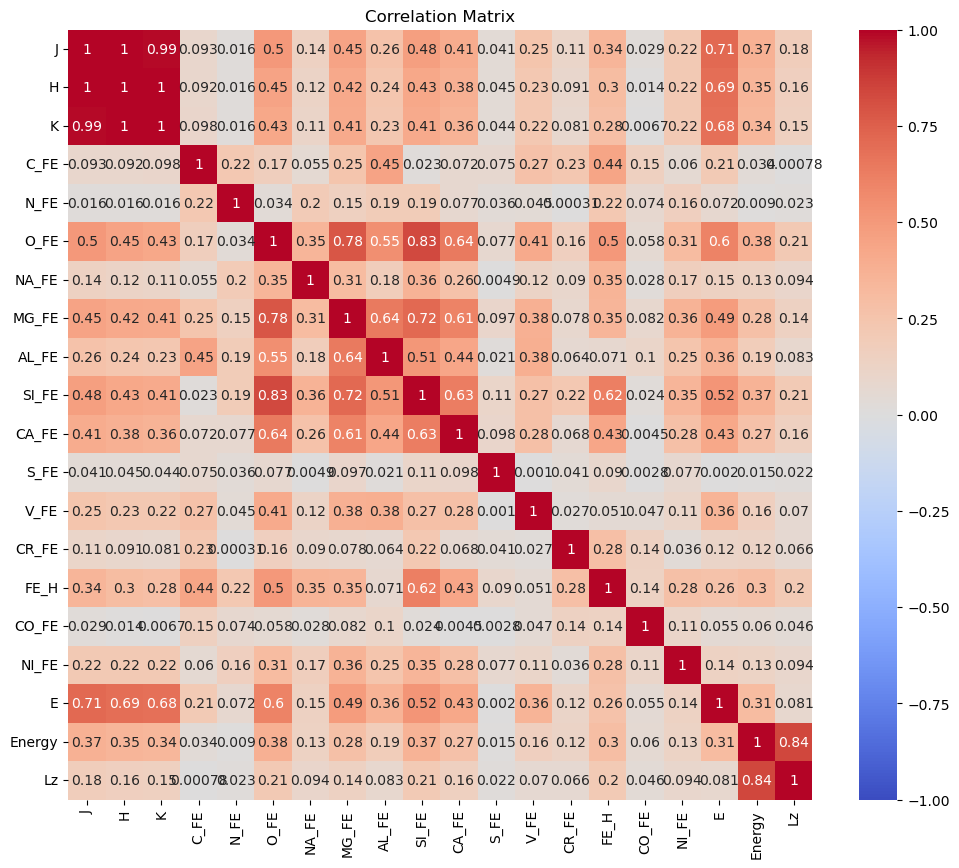

In [78]:
import seaborn as sns
corr = data.corr().abs()

# Plot
plt.figure(figsize=(12, 10))

sns.heatmap(
    corr,
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1
)


plt.title("Correlation Matrix")
plt.show()

In [79]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [80]:
CORR_THRESHOLD = 0.35

upper_triangle = corr.where(
    np.triu(np.ones(corr.shape), k=1).astype(bool)
)


to_drop = [
    column
    for column in upper_triangle.columns
    if any(upper_triangle[column] > CORR_THRESHOLD)
]


remaining_features = [
    col for col in data if col not in to_drop
]

print(f"\nCorrelation threshold: {CORR_THRESHOLD}")
print(f"\nDropped {len(to_drop)} features:\n")
print(to_drop)

print(f"\nRemaining {len(remaining_features)} features:\n")
print(remaining_features)

# optional:
# reduced dataframe
df_reduced = data[remaining_features]

print("\nReduced dataframe shape:")
print(df_reduced.shape)


Correlation threshold: 0.35

Dropped 14 features:

['H', 'K', 'O_FE', 'NA_FE', 'MG_FE', 'AL_FE', 'SI_FE', 'CA_FE', 'V_FE', 'FE_H', 'NI_FE', 'E', 'Energy', 'Lz']

Remaining 6 features:

['J', 'C_FE', 'N_FE', 'S_FE', 'CR_FE', 'CO_FE']

Reduced dataframe shape:
(5950, 6)


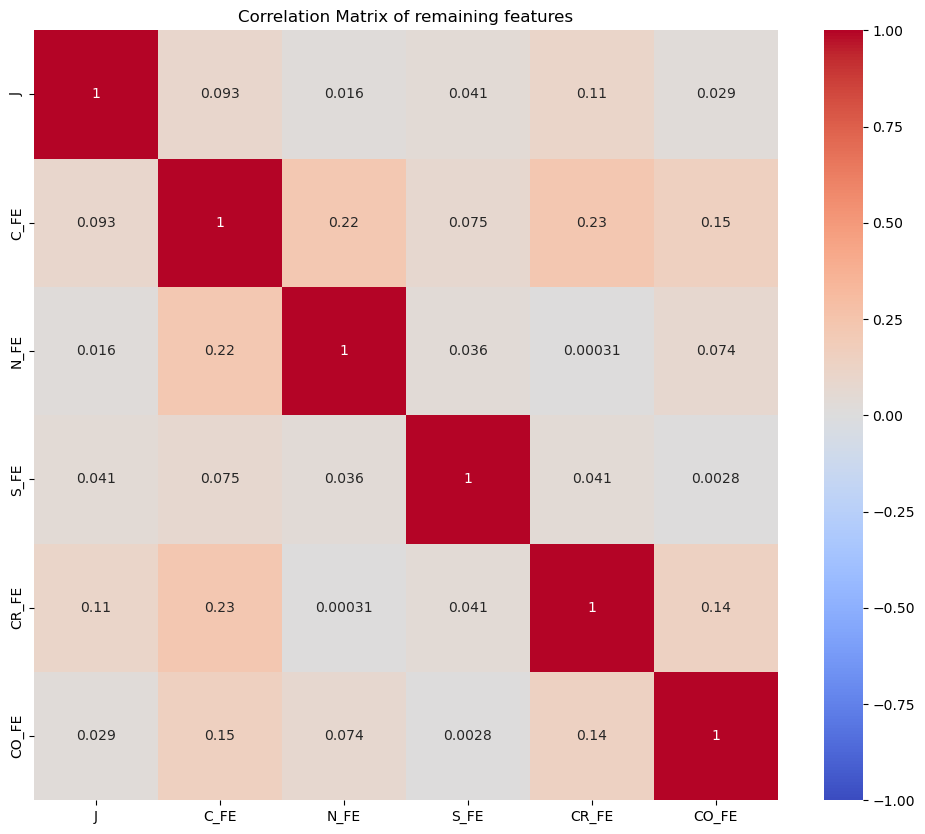

In [81]:
corr_reduced = df_reduced.corr().abs()

# Plot
plt.figure(figsize=(12, 10))

sns.heatmap(
    corr_reduced,
    annot=True,
    cmap='coolwarm',
    vmin=-1,
    vmax=1
)


plt.title("Correlation Matrix of remaining features")
plt.show()

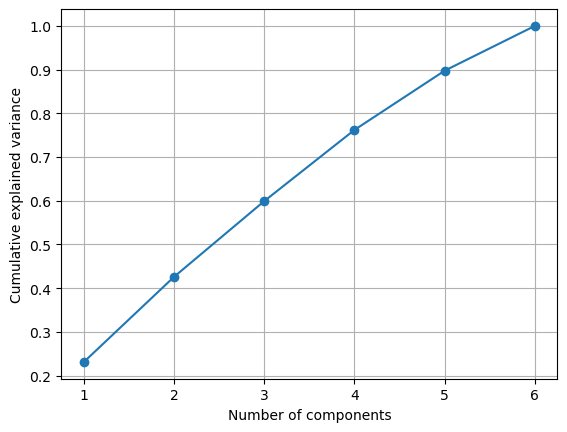

In [82]:
scaler = StandardScaler()

X = df_reduced.select_dtypes(include=[np.number]).dropna()
X_scaled = scaler.fit_transform(X)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

explained = np.cumsum(pca.explained_variance_ratio_)

plt.plot(range(1, len(explained)+1), explained, marker='o')
plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.grid(True)
plt.show()

In [83]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

kpca = KernelPCA(n_components=2, kernel='rbf', gamma=0.1)
X_kpca = kpca.fit_transform(X_scaled)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

umap_model = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X_scaled)

/home/jona/micromamba/envs/appmlenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


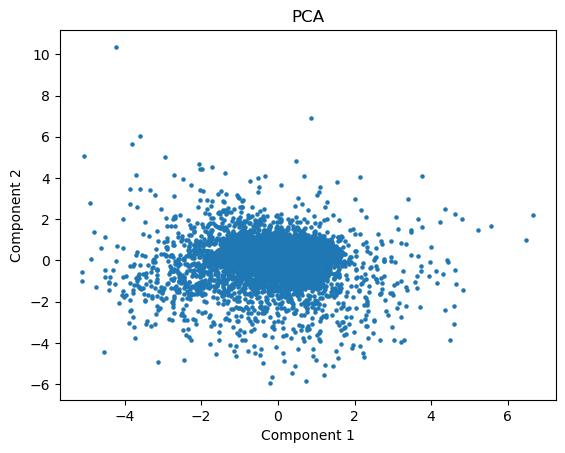

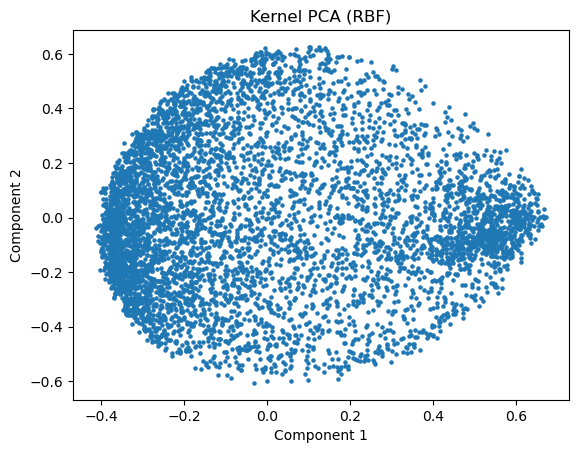

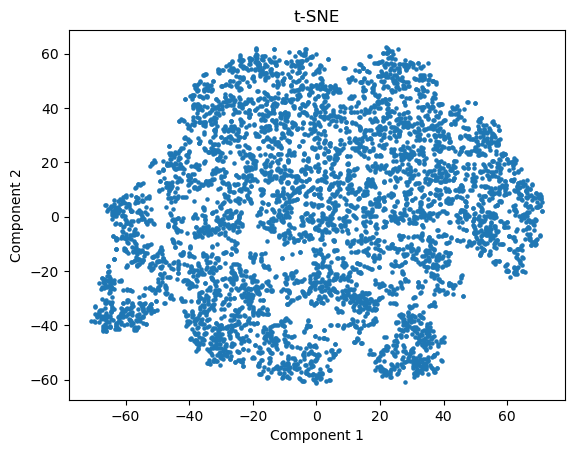

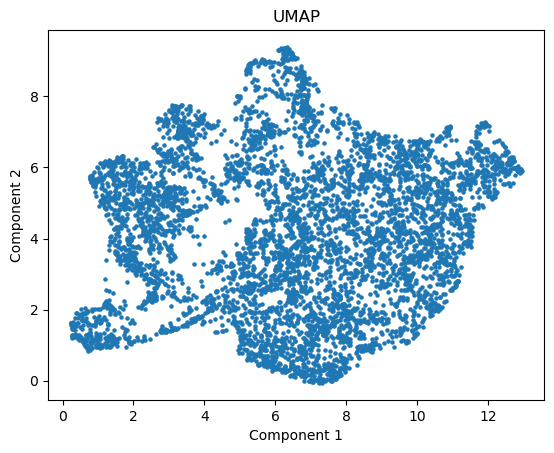

In [84]:
def plot_embedding(X_embedded, title):
    plt.figure()
    plt.scatter(X_embedded[:, 0], X_embedded[:, 1], s = 5)
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.show()

plot_embedding(X_pca, "PCA")
plot_embedding(X_kpca, "Kernel PCA (RBF)")
plot_embedding(X_tsne, "t-SNE")
plot_embedding(X_umap, "UMAP")

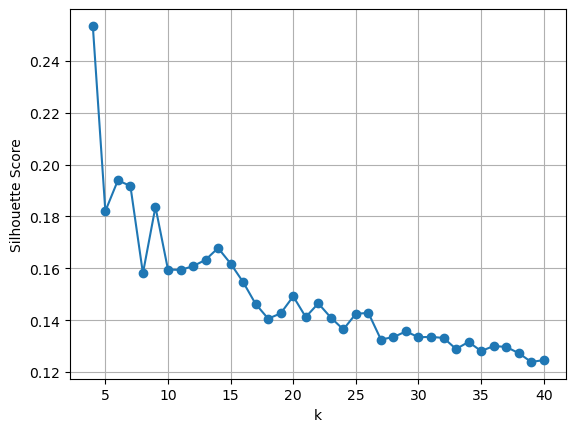

In [85]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

sil_scores = []

for k in range(4, 41):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)

    score = silhouette_score(X_scaled, labels)
    sil_scores.append(score)

plt.plot(range(4,41), sil_scores, marker='o')
plt.xlabel("k")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.show()

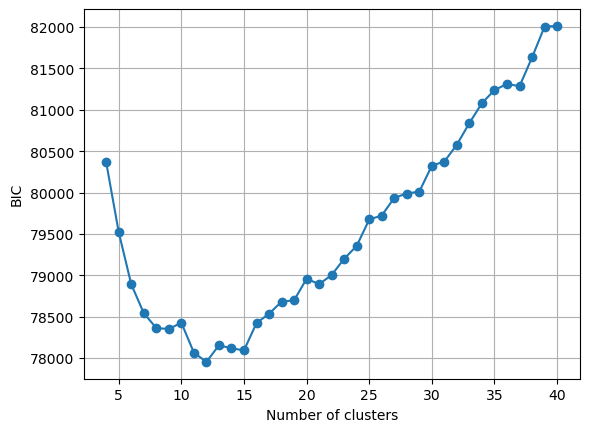

In [86]:
from sklearn.mixture import GaussianMixture

bic_scores = []

for k in range(4, 41):
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(X_scaled)

    bic_scores.append(gmm.bic(X_scaled))

plt.plot(range(4,41), bic_scores, marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("BIC")
plt.grid(True)
plt.show()

In [87]:
import hdbscan

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=8,
    min_samples=1
)

labels = clusterer.fit_predict(X_scaled)

print("Number of clusters:",
      len(set(labels)) - (1 if -1 in labels else 0))

print("Noise points:",
      sum(labels == -1))

Number of clusters: 4
Noise points: 637


/home/jona/micromamba/envs/appmlenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


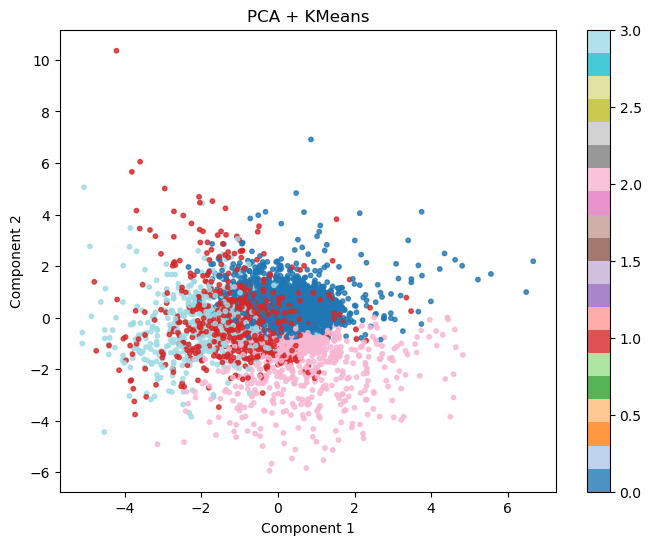

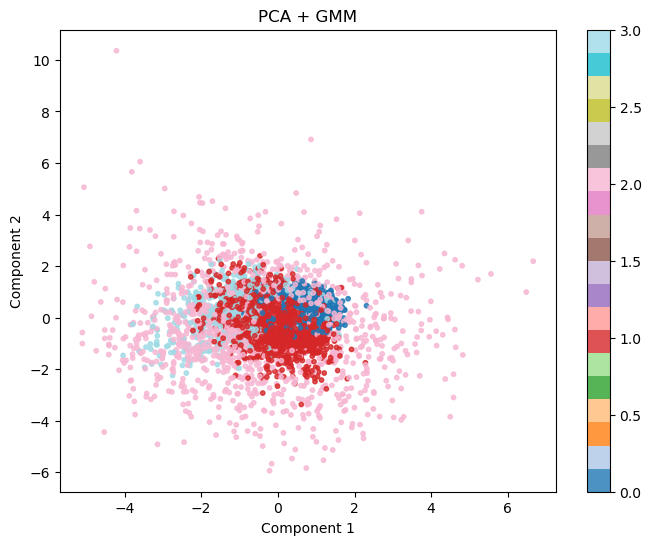

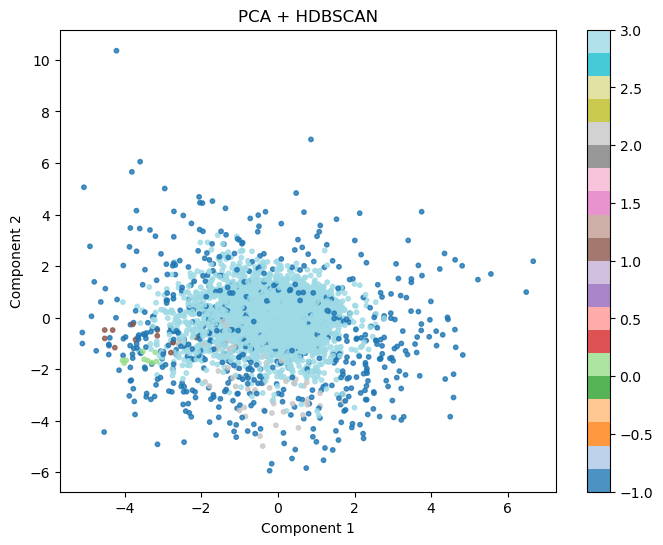

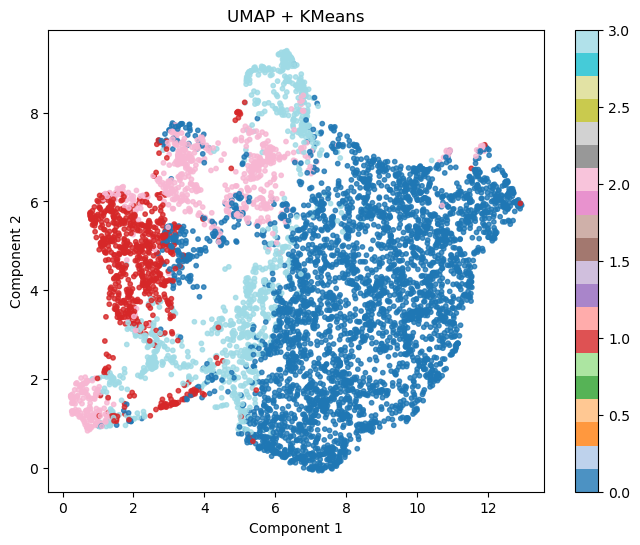

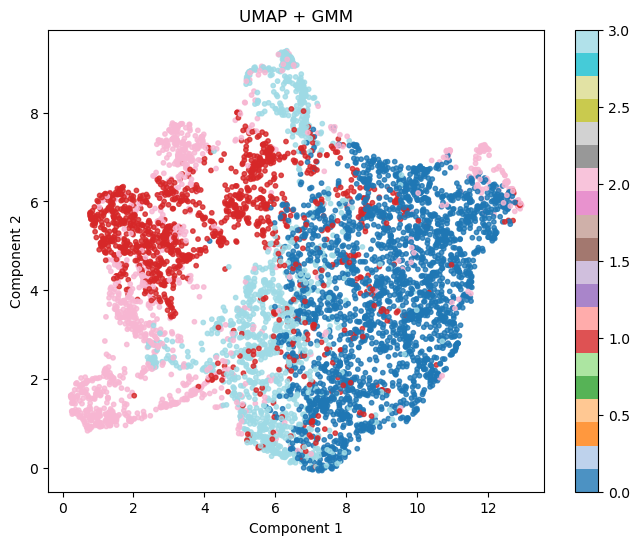

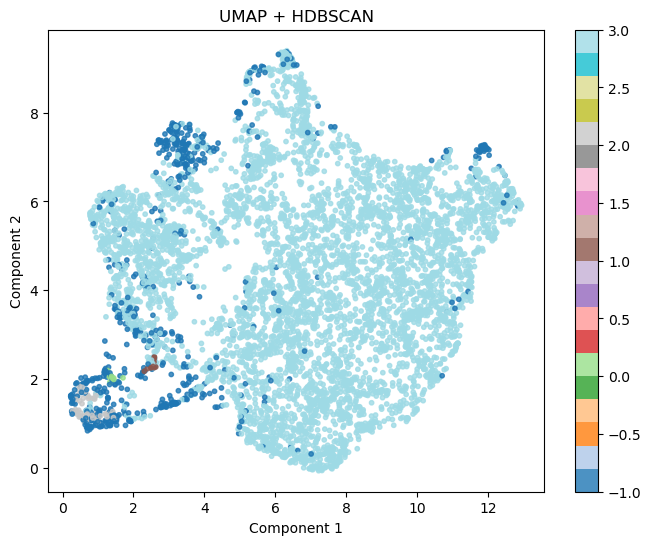

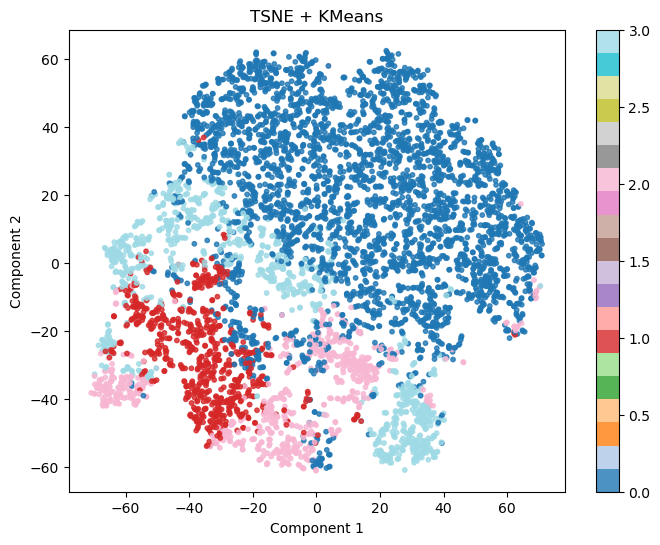

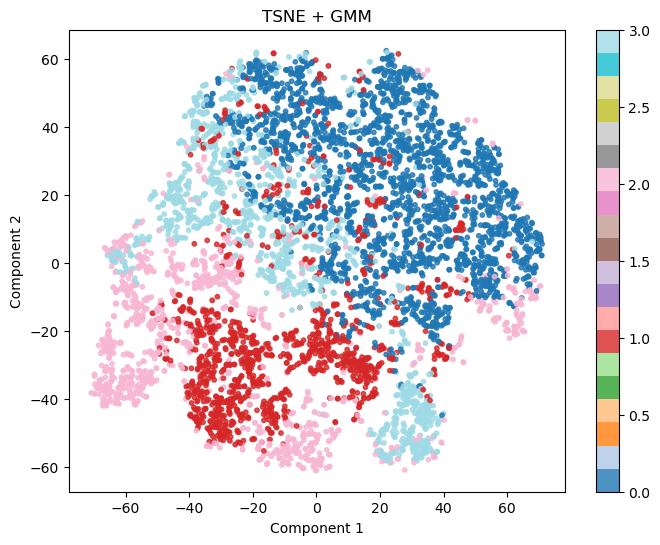

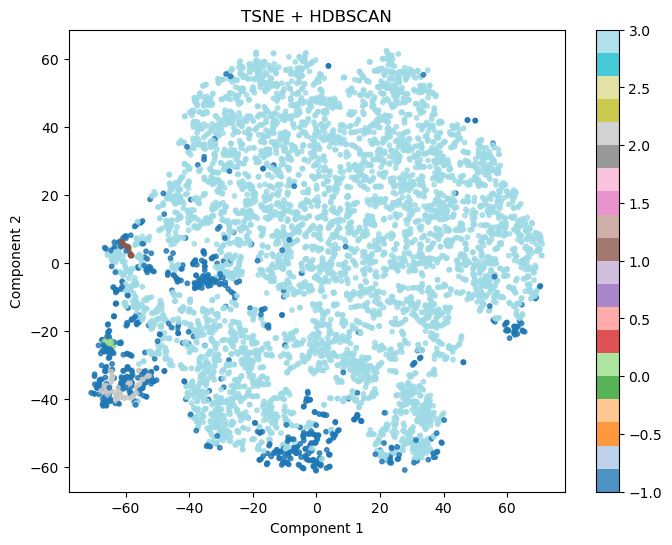

In [88]:
kmeans = KMeans(
    n_clusters=4,
    random_state=42
)

kmeans_labels = kmeans.fit_predict(X_scaled)


gmm = GaussianMixture(
    n_components=4,
    random_state=42
)

gmm_labels = gmm.fit_predict(X_scaled)

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=8,
    min_samples=1
)

hdbscan_labels = clusterer.fit_predict(X_scaled)


pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)


umap_model = umap.UMAP(
    n_components=2,
    random_state=42
)

X_umap = umap_model.fit_transform(X_scaled)


tsne = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42
)

X_tsne = tsne.fit_transform(X_scaled)


def plot_clusters(embedding, labels, title):
    
    plt.figure(figsize=(8,6))
    
    scatter = plt.scatter(
        embedding[:,0],
        embedding[:,1],
        c=labels,
        cmap='tab20',
        s=10,
        alpha=0.8
    )
    
    plt.title(title)
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    
    plt.colorbar(scatter)
    
    plt.show()


plot_clusters(X_pca, kmeans_labels, "PCA + KMeans")
plot_clusters(X_pca, gmm_labels, "PCA + GMM")
plot_clusters(X_pca, hdbscan_labels, "PCA + HDBSCAN")

plot_clusters(X_umap, kmeans_labels, "UMAP + KMeans")
plot_clusters(X_umap, gmm_labels, "UMAP + GMM")
plot_clusters(X_umap, hdbscan_labels, "UMAP + HDBSCAN")

plot_clusters(X_tsne, kmeans_labels, "TSNE + KMeans")
plot_clusters(X_tsne, gmm_labels, "TSNE + GMM")
plot_clusters(X_tsne, hdbscan_labels, "TSNE + HDBSCAN")

PCA explained variance:
[0.32121727 0.10791588]
Total: 0.4291331542326565


/home/jona/micromamba/envs/appmlenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


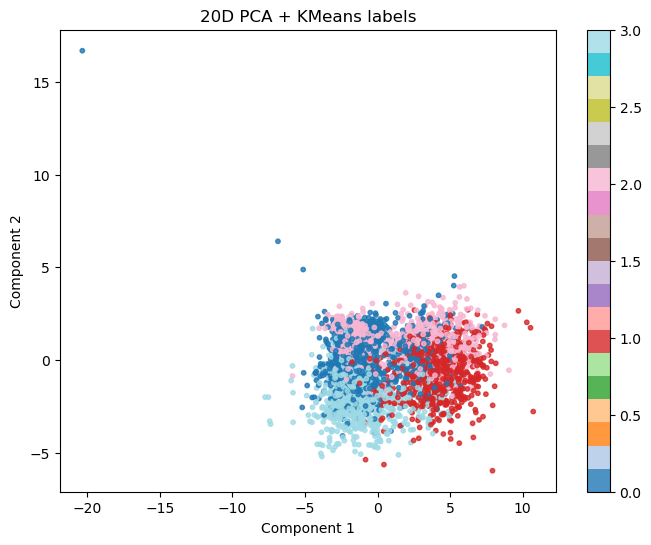

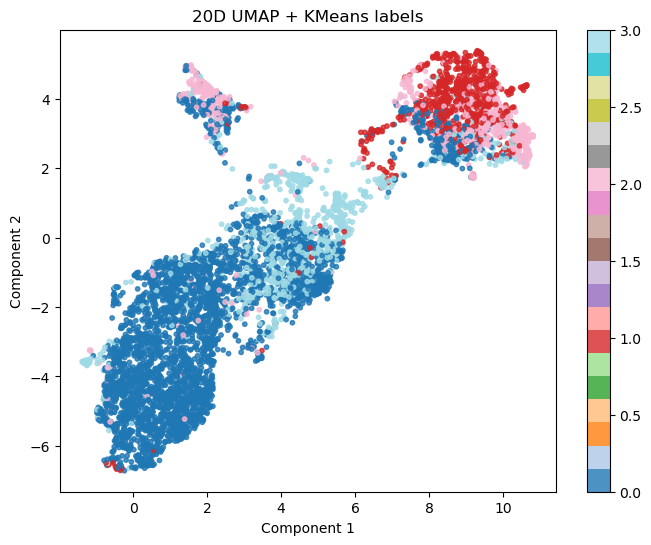

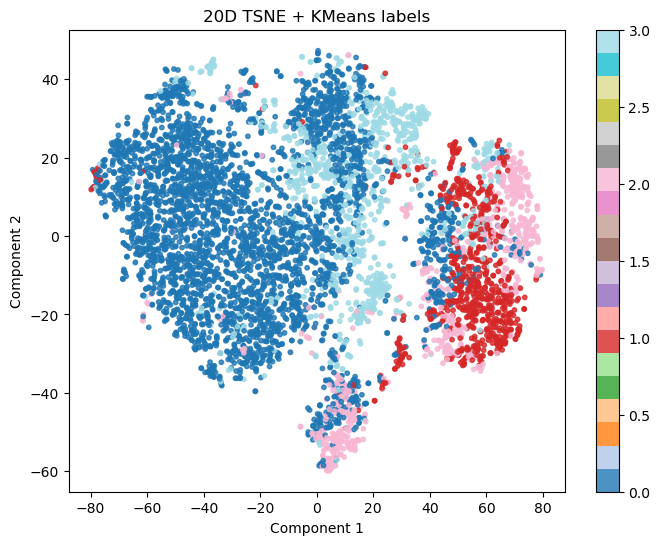

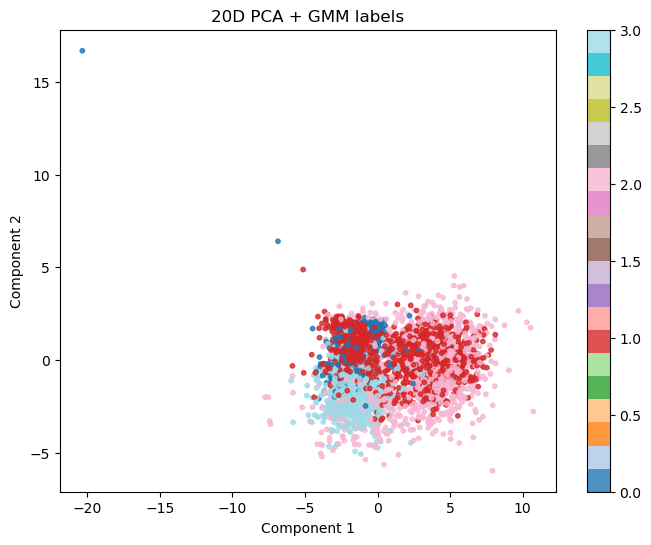

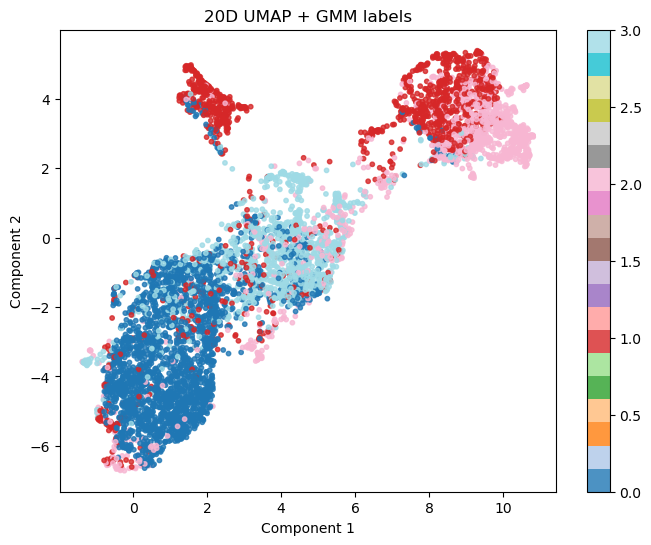

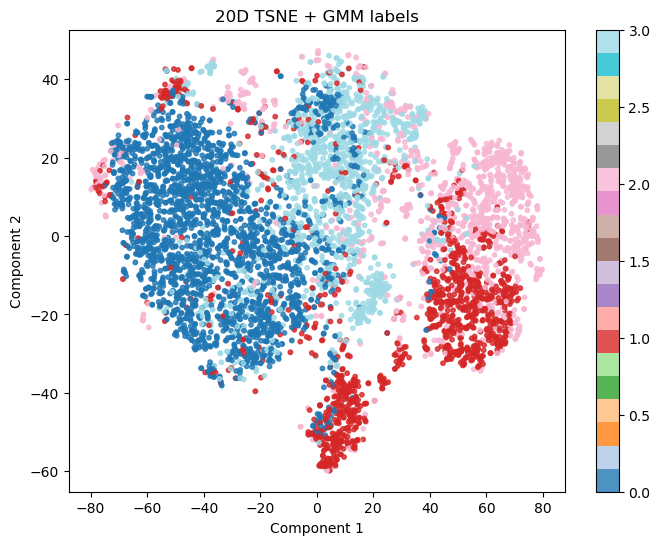

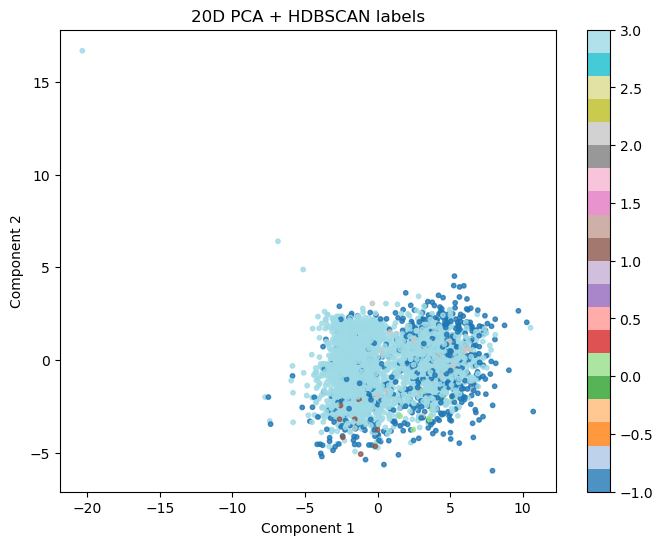

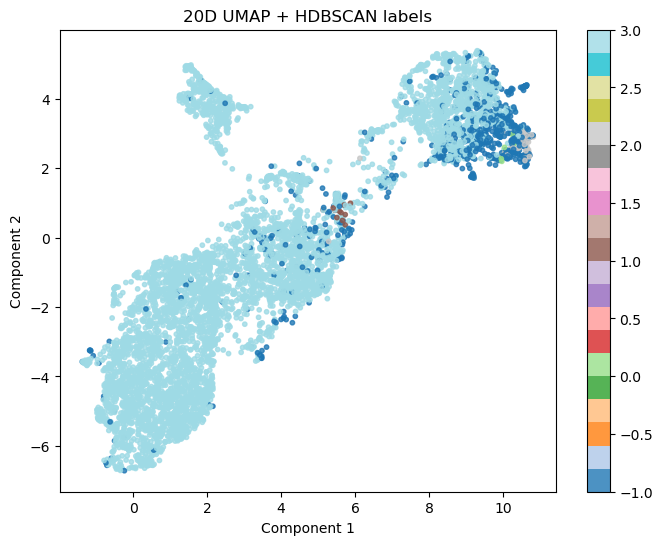

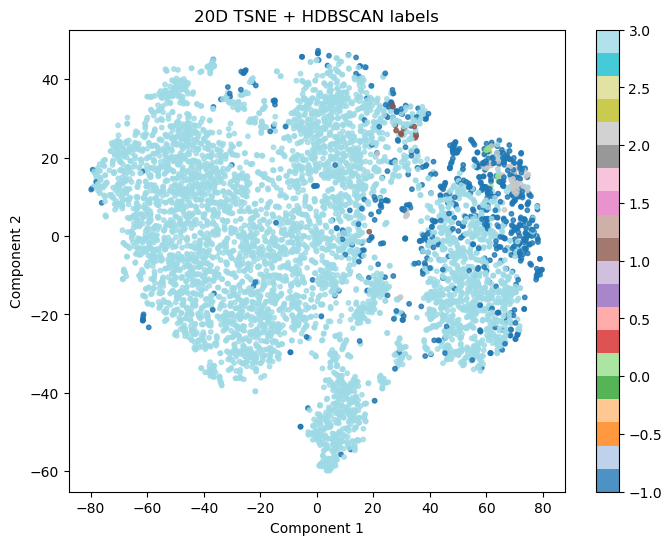

In [89]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import umap



df_full = data.select_dtypes(include=[np.number])

X_full = df_full.values

# standardize
scaler_full = StandardScaler()
X_full_scaled = scaler_full.fit_transform(X_full)

# ============================================================
# 2. DIMENSIONALITY REDUCTION IN 20D SPACE
# ============================================================

# ---------- PCA ----------
pca_full = PCA(n_components=2)

X_pca_full = pca_full.fit_transform(X_full_scaled)

# explained variance
print("PCA explained variance:")
print(pca_full.explained_variance_ratio_)
print("Total:", np.sum(pca_full.explained_variance_ratio_))

# ---------- UMAP ----------
umap_full = umap.UMAP(
    n_components=2,
    random_state=42
)

X_umap_full = umap_full.fit_transform(X_full_scaled)

# ---------- TSNE ----------
tsne_full = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42
)

X_tsne_full = tsne_full.fit_transform(X_full_scaled)

# ============================================================
# 3. VISUALIZATION FUNCTION
# ============================================================

def plot_embedding(embedding, labels, title):

    plt.figure(figsize=(8,6))

    scatter = plt.scatter(
        embedding[:,0],
        embedding[:,1],
        c=labels,
        cmap='tab20',
        s=10,
        alpha=0.8
    )

    plt.title(title)

    plt.xlabel("Component 1")
    plt.ylabel("Component 2")

    plt.colorbar(scatter)

    plt.show()

# ============================================================
# 4. VISUALIZE CLUSTERS IN 20D EMBEDDINGS
# ============================================================

# ---------- KMEANS LABELS ----------
plot_embedding(
    X_pca_full,
    kmeans_labels,
    "20D PCA + KMeans labels"
)

plot_embedding(
    X_umap_full,
    kmeans_labels,
    "20D UMAP + KMeans labels"
)

plot_embedding(
    X_tsne_full,
    kmeans_labels,
    "20D TSNE + KMeans labels"
)

# ---------- GMM LABELS ----------
plot_embedding(
    X_pca_full,
    gmm_labels,
    "20D PCA + GMM labels"
)

plot_embedding(
    X_umap_full,
    gmm_labels,
    "20D UMAP + GMM labels"
)

plot_embedding(
    X_tsne_full,
    gmm_labels,
    "20D TSNE + GMM labels"
)

# ---------- HDBSCAN LABELS ----------
plot_embedding(
    X_pca_full,
    hdbscan_labels,
    "20D PCA + HDBSCAN labels"
)

plot_embedding(
    X_umap_full,
    hdbscan_labels,
    "20D UMAP + HDBSCAN labels"
)

plot_embedding(
    X_tsne_full,
    hdbscan_labels,
    "20D TSNE + HDBSCAN labels"
)

Data shape: (5950, 20)
PCA explained variance: [0.32121727 0.10791588]


/home/jona/micromamba/envs/appmlenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


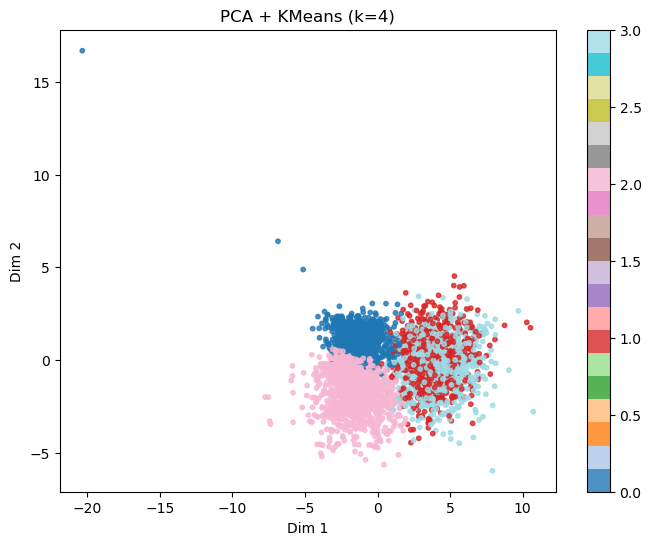

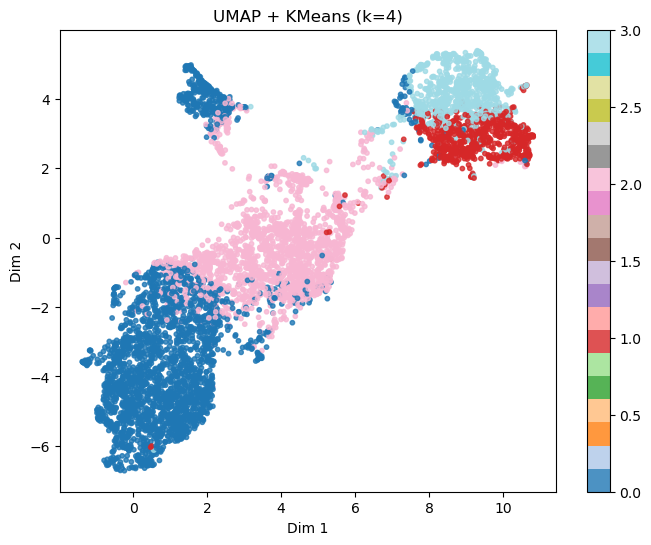

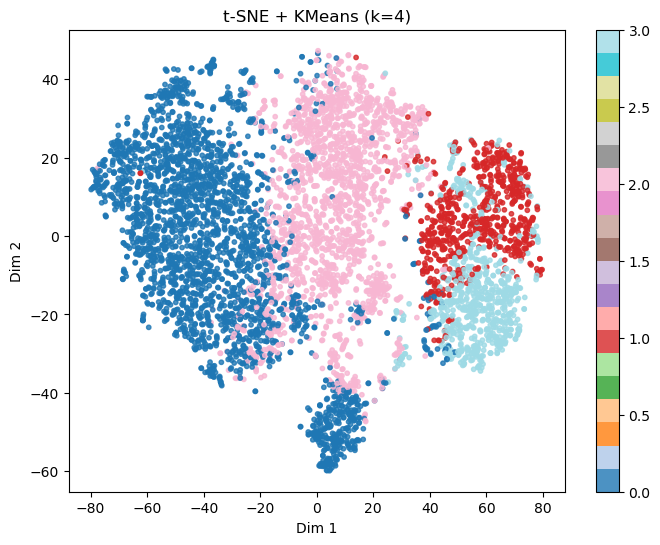

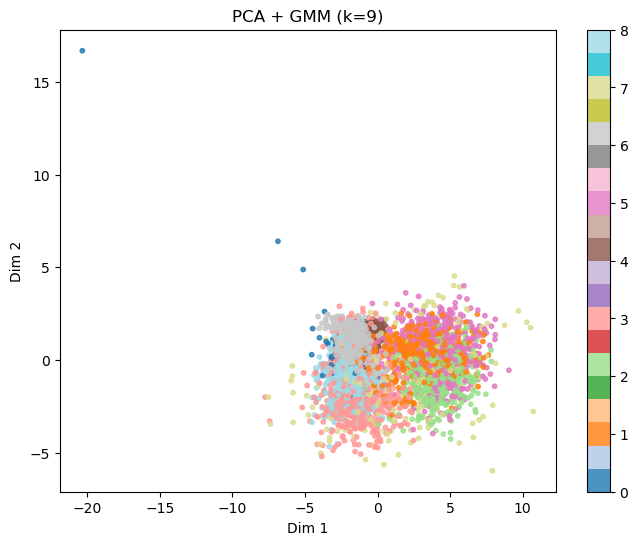

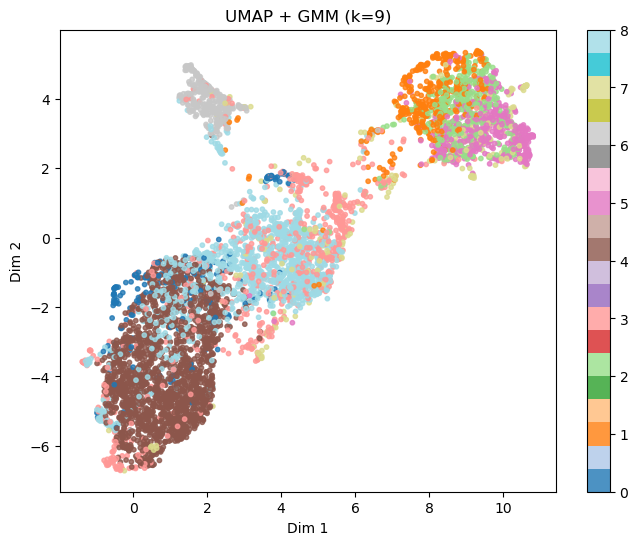

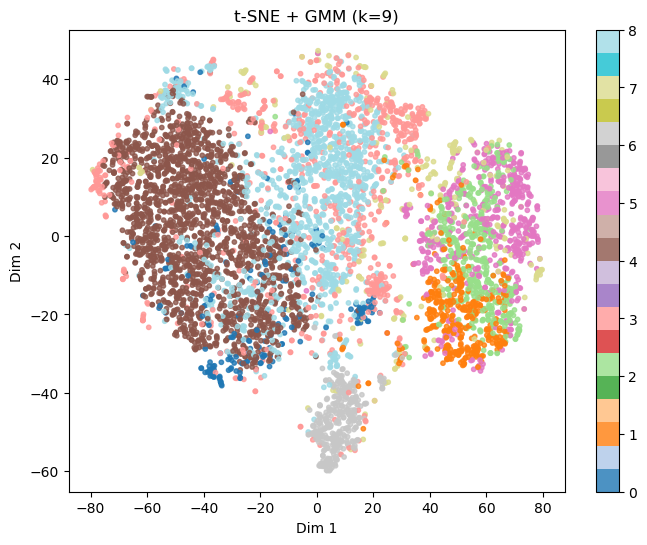

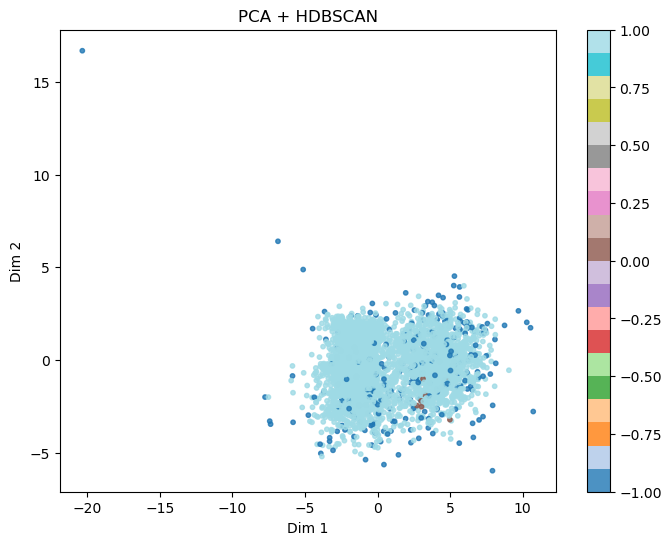

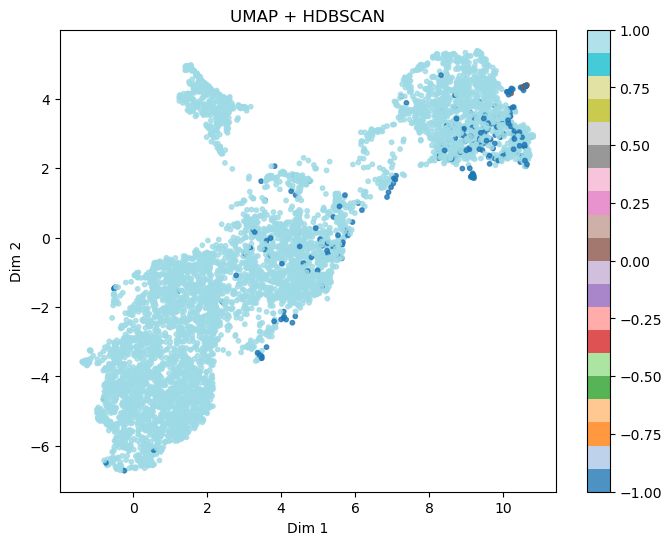

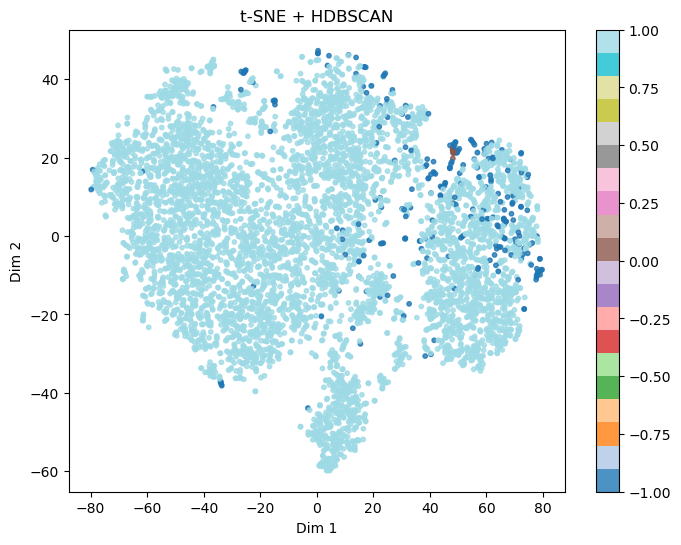

In [93]:
# ============================================================
# 1. LOAD + PREPARE FULL 20-FEATURE DATA
# ============================================================

df_full = data.select_dtypes(include=[np.number])  # ensure numeric only
X = df_full.values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print("Data shape:", X_scaled.shape)

# ============================================================
# 2. CLUSTERING (ALL 20 FEATURES)
# ============================================================

# --- KMEANS ---
kmeans = KMeans(n_clusters=4, random_state=42)
labels_kmeans = kmeans.fit_predict(X_scaled)

# --- GMM ---
gmm = GaussianMixture(n_components=9, random_state=42)
labels_gmm = gmm.fit_predict(X_scaled)

# --- HDBSCAN ---
hdb = hdbscan.HDBSCAN(min_cluster_size=8, min_samples=1)
labels_hdb = hdb.fit_predict(X_scaled)

# ============================================================
# 3. DIMENSIONALITY REDUCTION (ON ALL FEATURES)
# ============================================================

# --- PCA ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

print("PCA explained variance:", pca.explained_variance_ratio_)

# --- UMAP ---
umap_model = umap.UMAP(
    n_components=2,
    random_state=42
)
X_umap = umap_model.fit_transform(X_scaled)

# --- t-SNE ---
tsne = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42
)
X_tsne = tsne.fit_transform(X_scaled)

# ============================================================
# 4. PLOTTING FUNCTION
# ============================================================

def plot(embed, labels, title):
    plt.figure(figsize=(8,6))
    plt.scatter(
        embed[:,0],
        embed[:,1],
        c=labels,
        cmap='tab20',
        s=10,
        alpha=0.8
    )
    plt.title(title)
    plt.xlabel("Dim 1")
    plt.ylabel("Dim 2")
    plt.colorbar()
    plt.show()

# ============================================================
# 5. VISUALIZE ALL METHODS
# ============================================================

methods = {
    "KMeans (k=4)": labels_kmeans,
    "GMM (k=9)": labels_gmm,
    "HDBSCAN": labels_hdb
}

embeddings = {
    "PCA": X_pca,
    "UMAP": X_umap,
    "t-SNE": X_tsne
}

for m_name, labels in methods.items():
    for e_name, embed in embeddings.items():
        plot(embed, labels, f"{e_name} + {m_name}")

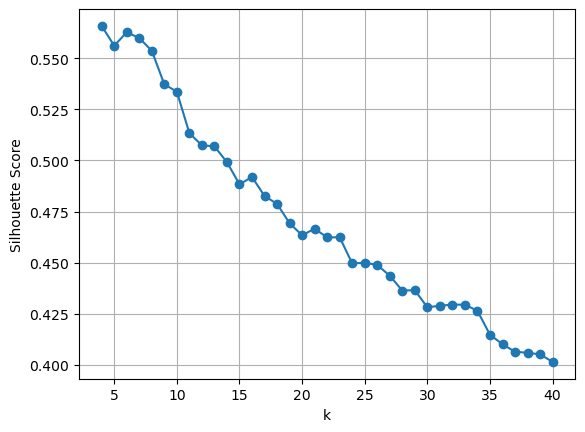

In [91]:
sil_scores = []

for k in range(4, 41):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)

    score = silhouette_score(X, labels)
    sil_scores.append(score)

plt.plot(range(4,41), sil_scores, marker='o')
plt.xlabel("k")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.show()

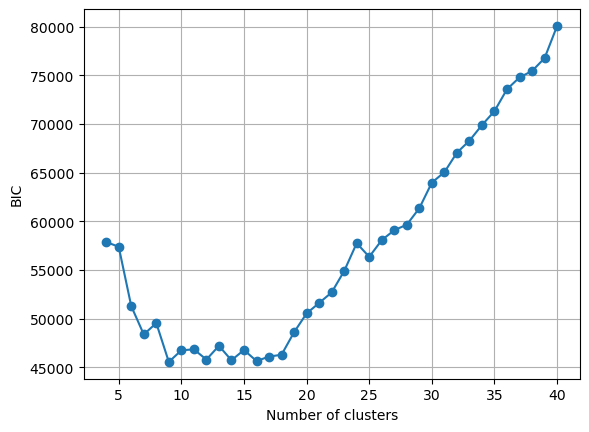

In [92]:
bic_scores = []

for k in range(4, 41):
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(X)

    bic_scores.append(gmm.bic(X))

plt.plot(range(4,41), bic_scores, marker='o')
plt.xlabel("Number of clusters")
plt.ylabel("BIC")
plt.grid(True)
plt.show()